In [1]:
from IPython.display import clear_output

In [2]:
!pip install datasets
clear_output()

In [3]:
# installing the requirements 
import nltk  # Import the nltk library for natural language processing tasks
from gensim.models import Word2Vec  # Import the Word2Vec class from gensim.models for training Word2Vec models
from nltk.tokenize import word_tokenize  # Import the word_tokenize function from nltk.tokenize for tokenizing text
from tqdm import tqdm  # Import tqdm for displaying progress bars
from sklearn.metrics.pairwise import cosine_similarity  # Import cosine_similarity for calculating similarity between vectors
from datasets import load_dataset  # Import the load_dataset function from the datasets library to load datasets
import datasets  # Import the datasets library
import math  # Importing the math library for mathematical functions
from collections import Counter  # Importing Counter from the collections module for counting hashable objects
import string  # Importing the string module for common string operations
import numpy as np  # Importing numpy library and giving it an alias 'np'
from tqdm import tqdm  # Importing tqdm for displaying progress bars

In [4]:
nltk.download('punkt')  # Download the punkt tokenizer data for nltk
clear_output()  # Clear the output of the cell to keep the notebook clean

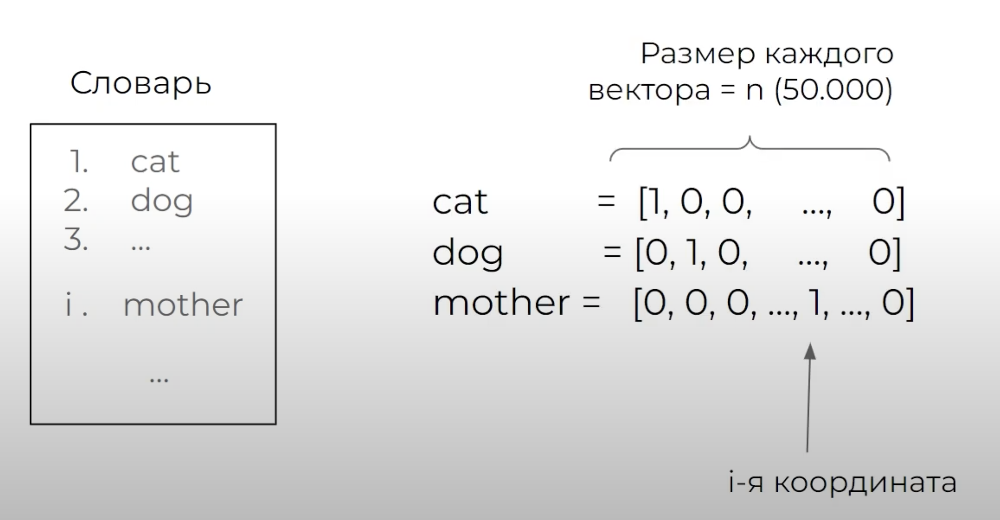

# One-hot encoding

"""
### Disadvantages:

- Word vectors do not reflect the meaning of the word.
  It is impossible to measure the "similarity" of two words in meaning;
- Vectors are quite sparse, requiring a lot of extra memory;
- Vocabulary size is limited.
  Words that do not fall into the vocabulary cannot be processed;
- When the size of the vocabulary changes, the vectors need to be recalculated.
"""


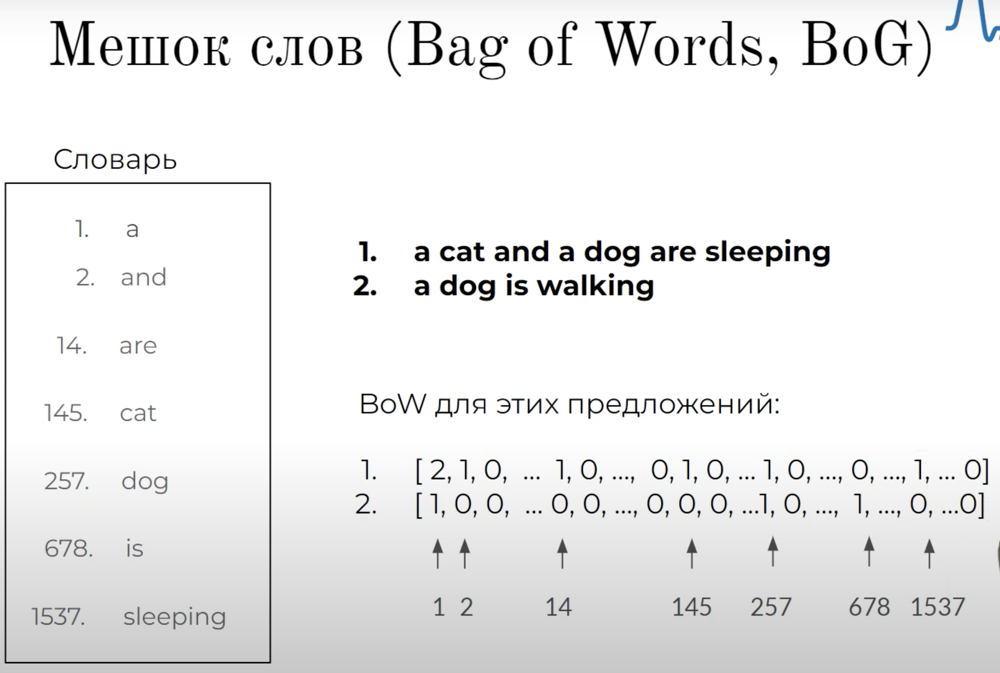

# Bag of Words

"""
### Disadvantages:

- Inherits all the disadvantages of one-hot encoding:
  - Sentence vectors do not reflect the meaning of the sentence well. The order of words is not taken into account;
  - Vectors are quite sparse, requiring a lot of extra memory;
  - Fixed vocabulary size.
    Words that do not fall into the vocabulary cannot be processed;
  - When the size of the vocabulary changes, the vectors need to be recalculated.
"""


# TF-IDF Detailed Explanation with Advantages and Disadvantages
### TF-IDF (Term Frequency-Inverse Document Frequency)

**Overview:**
TF-IDF is a statistical measure used to evaluate the importance of a word in a document relative to a collection of documents (corpus). It is a commonly used technique in information retrieval and text mining.

### Components

1. **Term Frequency (TF):**
   - **Definition:** Measures the frequency of a word in a document.
   - **Formula:**

     $$\text{TF}(t, d) = \frac{\text{Number of times term } t \text{ appears in document } d}{\text{Total number of terms in document } d}$$
   - **Explanation:** If a word appears frequently in a document, its TF value will be high. However, frequent words like "the" might be common across all documents, so TF alone is not sufficient.

2. **Inverse Document Frequency (IDF):**
   - **Definition:** Measures how common or rare a word is across all documents.
   - **Formula:**
    $$
     \text{IDF}(t, D) = \log \left( \frac{\text{Total number of documents}}{\text{Number of documents containing term } t} \right)
     $$
   - **Explanation:** If a word appears in many documents, its IDF value will be low, reflecting its commonness. Conversely, if it appears in few documents, its IDF will be high, indicating its rarity.

3. **TF-IDF Score:**
   - **Definition:** Combines TF and IDF to assign a score to each word in each document.
   - **Formula:**
     $$
     \text{TF-IDF}(t, d, D) = \text{TF}(t, d) \times \text{IDF}(t, D)
     $$
   - **Explanation:** The TF-IDF score increases with the number of times a word appears in a document but is offset by the frequency of the word in the entire corpus. This helps in highlighting important words that are unique to a document.

### Detailed Explanation

#### Step-by-Step Calculation

1. **Calculate Term Frequency (TF):**
   - **Example Document:** "the cat in the hat"
   - **Term Frequencies:**
     - "the": 2
     - "cat": 1
     - "in": 1
     - "hat": 1
   - **TF Calculation:**
     - TF("the") = 2 / 5 = 0.4
     - TF("cat") = 1 / 5 = 0.2
     - TF("in") = 1 / 5 = 0.2
     - TF("hat") = 1 / 5 = 0.2

2. **Calculate Inverse Document Frequency (IDF):**
   - **Corpus:** ["the cat in the hat", "the quick brown fox", "jumped over the lazy dog"]
   - **Document Count:** 3
   - **IDF Calculation:**
     - IDF("the") = log(3 / 3) = log(1) = 0
     - IDF("cat") = log(3 / 1) = log(3) ≈ 1.0986
     - IDF("in") = log(3 / 1) = log(3) ≈ 1.0986
     - IDF("hat") = log(3 / 1) = log(3) ≈ 1.0986
     - IDF("quick") = log(3 / 1) = log(3) ≈ 1.0986

3. **Calculate TF-IDF Score:**
   - **TF-IDF Calculation for "the cat in the hat":**
     - TF-IDF("the") = 0.4 * 0 = 0
     - TF-IDF("cat") = 0.2 * 1.0986 ≈ 0.2197
     - TF-IDF("in") = 0.2 * 1.0986 ≈ 0.2197
     - TF-IDF("hat") = 0.2 * 1.0986 ≈ 0.2197

### Advantages

1. **Simplicity and Ease of Use:**
   - TF-IDF is simple to implement and understand.
   - It does not require any advanced machine learning algorithms.

2. **Effectiveness:**
   - It is effective in identifying important words in documents, particularly in information retrieval tasks.

3. **Baseline Method:**
   - TF-IDF serves as a good baseline for text representation and can be used before trying more complex methods like word embeddings.

4. **Interpretability:**
   - The scores are easily interpretable as they are based on word frequencies and document occurrences.

### Disadvantages

1. **Sparsity:**
   - The resulting vectors are high-dimensional and sparse, which can be inefficient for storage and computation.

2. **Lack of Semantic Understanding:**
   - TF-IDF does not capture the meaning or semantic relationships between words. Words with similar meanings but different spellings (e.g., "car" and "automobile") will be treated as unrelated.

3. **Bias Towards Frequent Terms:**
   - Common terms that appear frequently across documents may be down-weighted too much, while rare terms may be given too much importance.

4. **Static Representation:**
   - TF-IDF provides a static representation of words. It does not adapt to the context or changes in language over time.

5. **Document Length Bias:**
   - Longer documents can have higher TF values for terms simply because they contain more words.

### Conclusion

TF-IDF is a foundational technique in text mining and information retrieval that helps identify important words in a document relative to a corpus. Its simplicity and effectiveness make it a popular choice for many text-based applications. However, its limitations in capturing semantic relationships and handling high-dimensional data make it less suitable for more advanced NLP tasks compared to techniques like word embeddings (e.g., Word2Vec).
"""


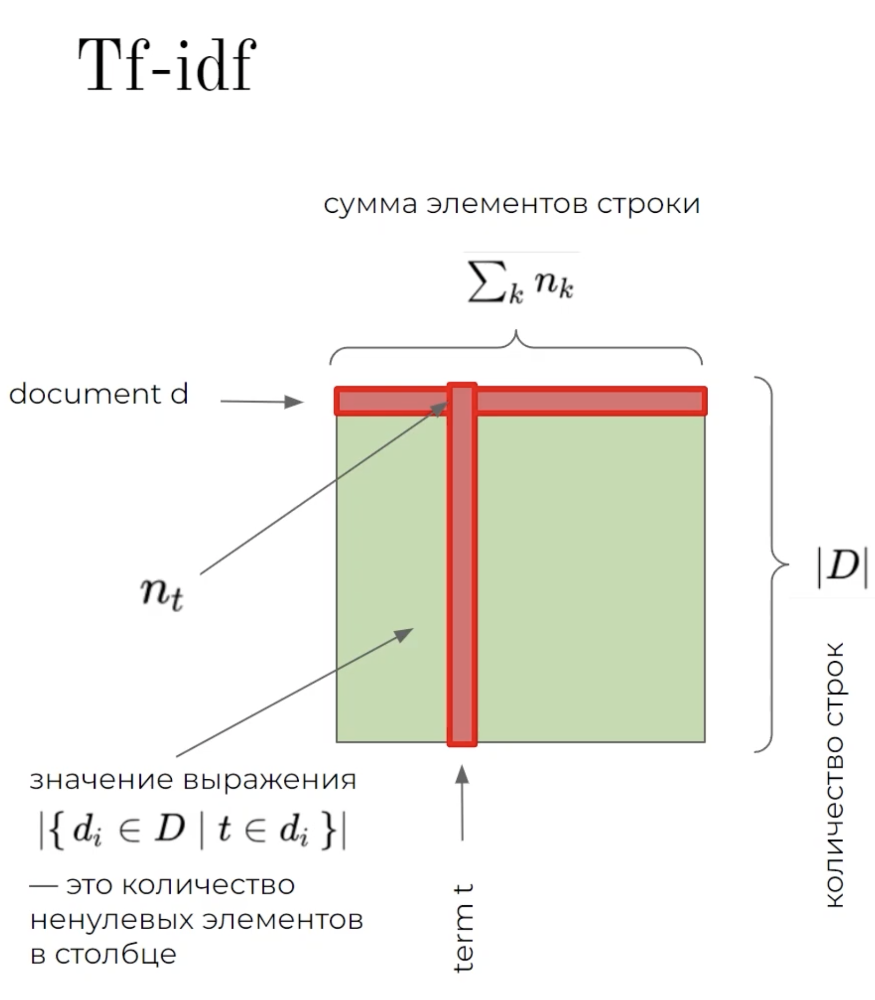

# Conent

In this demo, we will custom implement a TF-IDF calculator/model

TF-IDF is a technique of converting words into numerical representations so they can then be further used by models to perform some task

The cool thing about TF-IDF is that they have the ability to see how important a word is and they assign important words a higher value than non-important words

This means, that stop words will get a lower value assigned to them which means we don't have to manually remove stop words or atleast that the need for it is reduced

### TF-IDF Calculation
In the context of TF-IDF, there is no iterative optimization or learning process. Instead, it's a direct computation based on the given dataset. Here are the steps:

#### Term Frequency (TF):

* Count how often each word appears in a document.
* Normalize these counts by the total number of words in the document.


#### Inverse Document Frequency (IDF):
* Count how many documents contain each word.
* Compute the inverse document frequency to down-weight common words.


#### TF-IDF Score:

* Multiply the TF and IDF values to get the TF-IDF score for each word in each document.

In [5]:
def calculate_tf(documents):
    doc_tfs = []  # Initialize an empty list to store term frequency dictionaries for each document

    for doc in tqdm(documents, desc='Calculating TFs'):
        tf_doc = {}  # Initialize an empty dictionary to store term frequencies for the current document
        word_count = len(doc.split())  # Count the number of words in the document
        word_freq = Counter(doc.split())  # Count the frequency of each word in the document
        for word, freq in word_freq.items():
            tf_doc[word] = freq / word_count  # Calculate term frequency for each word
        doc_tfs.append(tf_doc)  # Add the term frequency dictionary to the list

    return doc_tfs  # Return the list of term frequency dictionaries


def calculate_idf(tfs):
    token_to_idfs = {}  # Initialize an empty dictionary to store inverse document frequencies
    doc_count = len(tfs)  # Count the number of documents
    all_tokens = [token for tf in tfs for token in tf]  # Flatten the list of tokens from all term frequency dictionaries
    for token in tqdm(all_tokens, desc='Calculating IDFs'):
        doc_containing_token = sum([1 for tf in tfs if token in tf])  # Count the number of documents containing the token
        token_to_idfs[token] = math.log(doc_count / (1 + doc_containing_token))  # Calculate inverse document frequency

    return token_to_idfs  # Return the dictionary of inverse document frequencies

def calculate_tfidf(documents):
    documents = [doc.lower() for doc in documents]  # Convert all documents to lowercase

    doc_tfs = calculate_tf(documents)  # Calculate term frequencies for the documents
    token_to_idfs = calculate_idf(doc_tfs)  # Calculate inverse document frequencies

    doc_tfidfs = []  # Initialize an empty list to store TF-IDF dictionaries for each document

    for doc_tf in tqdm(doc_tfs, desc='Calculating TF-IDFs'):
        doc_tfidf = {token: tf * token_to_idfs[token] for token, tf in doc_tf.items()}  # Calculate TF-IDF for each token
        doc_tfidfs.append(doc_tfidf)  # Add the TF-IDF dictionary to the list

    return doc_tfidfs  # Return the list of TF-IDF dictionaries

def word_to_tf_idf_vector(word, doc_tfidfs):
    # A TF-IDF vector representation of a token/word is taken as a vector made of tf-idf of that token in all documents
    
    vector = [doc_tfidf.get(word.lower(), 0) for doc_tfidf in doc_tfidfs]  # Create a list of TF-IDF values for the word in each document
    vector = np.array(vector)  # Convert the list to a numpy array

    return vector  # Return the TF-IDF vector



In [6]:
train_data = load_dataset('imdb', split='train')['text']  # Load the 'train' split of the IMDB dataset and get the 'text' column
train_data = train_data[:500]  # Shorten the data because all 25k rows take too long to train


In [7]:
# remove punctuations from the data
translator = str.maketrans('', '', string.punctuation)  # Create a translation table to remove punctuation
train_data = list(map(lambda x: x.translate(translator), tqdm(train_data)))  # Remove punctuation from each document using the translation table


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 29311.53it/s]


In [8]:
doc_tfidfs = calculate_tfidf(train_data)  # Calculate TF-IDF values for the training data


Calculating TF-IDFs: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 20080.16it/s]


In [9]:
# Lets visualize some vectors
print(f'Vector sum for the word "the": {word_to_tf_idf_vector("the", doc_tfidfs).sum()}')
print(f'Vector sum for the word "plot": {word_to_tf_idf_vector("plot", doc_tfidfs).sum()}')

Vector sum for the word "the": 0.16488058605906525
Vector sum for the word "plot": 1.2984830346401326


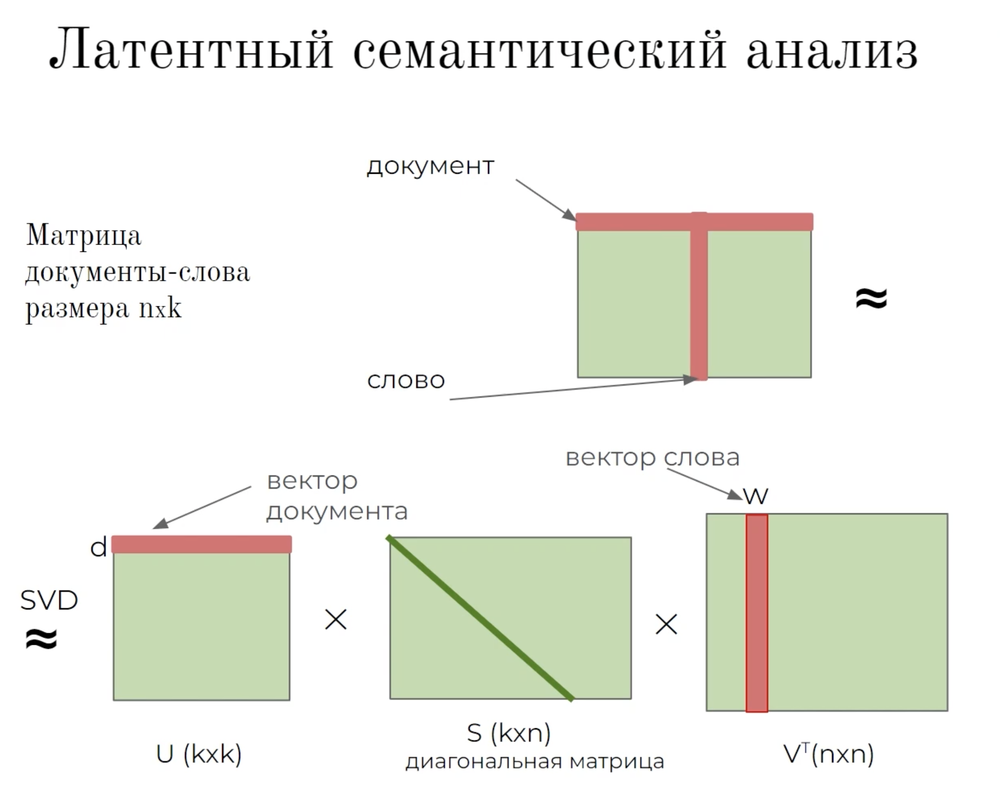

# Latent Semantic Analysis (LSA): Detailed Explanation

"""
### Latent Semantic Analysis (LSA): Detailed Explanation

**Overview:**
Latent Semantic Analysis (LSA), also known as Latent Semantic Indexing (LSI) when used for information retrieval, is a technique in natural language processing (NLP) and information retrieval for analyzing relationships between a set of documents and the terms they contain. LSA uses singular value decomposition (SVD) to reduce the dimensions of the term-document matrix, capturing the latent semantic structure in the data.

### Key Concepts

1. **Term-Document Matrix:**
   - The term-document matrix $ A $ is a matrix where each row corresponds to a unique term (word), each column corresponds to a document, and each entry represents the frequency (or TF-IDF score) of the term in the document.

2. **Singular Value Decomposition (SVD):**
   - SVD is a matrix factorization technique that decomposes the term-document matrix $ A $ into three matrices:
     $$
     A = U \Sigma V^T
     $$
     where:
     - $ U $ is an orthogonal matrix representing term vectors.
     - $ \Sigma $ is a diagonal matrix containing singular values, representing the importance of each dimension.
     - $ V $ is an orthogonal matrix representing document vectors.

3. **Dimensionality Reduction:**
   - By keeping only the top $ k $ singular values and corresponding vectors in $ U $ and $ V $, we reduce the dimensions of the term-document matrix. This reduced representation captures the most significant patterns in the data.

### Steps in LSA

1. **Construct the Term-Document Matrix:**
   - Create a matrix $ A $ where each entry $ A_{ij} $ represents the frequency or TF-IDF score of term $ i $ in document $ j $.

2. **Apply SVD:**
   - Decompose $ A $ using singular value decomposition:
     $$
     A = U \Sigma V^T
     $$

3. **Reduce Dimensions:**
   - Select the top $ k $ singular values and corresponding columns of $ U $ and $ V $ to form the reduced matrices $ U_k $, $ \Sigma_k $, and $ V_k $.

4. **Transform Data:**
   - The transformed term vectors are given by $ U_k \Sigma_k $ and the transformed document vectors are given by $ \Sigma_k V_k^T $.



### Advantages:

- Vectors have meaning;
- Ability to reduce the size of embeddings without significant loss of quality.

### Disadvantages:

- High computational complexity with a large number of documents;
- Fixed vocabulary size;
- When the document collection changes, vectors need to be recalculated;
- The probabilistic model of the method does not correspond to reality.
"""


# Content

In this demo, we will train a word2vec model on custom data. We will use IMDB dataset as our training data

a word2vec model is another way to convert strings(or words) to numerical represntation, so those vectors can then be used to perform some task or train another model.

A word2vec uses Continuous bag of words technique to learn embeddings of words it sees during training, and then saves them. After training, we can infer those vectors by providing the word. We will not delve into details about contiuous bag of words (CBOW) here.

The special thing about word2vec vectors (which is not found in TF-IDF or word to index) is that the distance in word2vec vectors (between each other) also represent information about how similar the words are to each other

for example, the vectors of words "cat" and "dog" will have a higher similarity (or lower distance) compared to the vectors of words "cat" and "building"


# Contextual Word Vectors

Consider three sentences and word candidates for the blanks:

1. Masha rides a _____
2. The wheel of the _____ was punctured
3. The _____ has a beautiful white frame

|              |       1      |       2      |       3      |
|--------------|--------------|--------------|--------------|
| Bicycle      |      +       |      +       |      +       |
| Motorcycle   |      +       |      +       |      +       |
| Car          |      +       |      +       |      -       |
| Horse        |      +       |      -       |      -       |




How many times the word x was in the context of the word y.
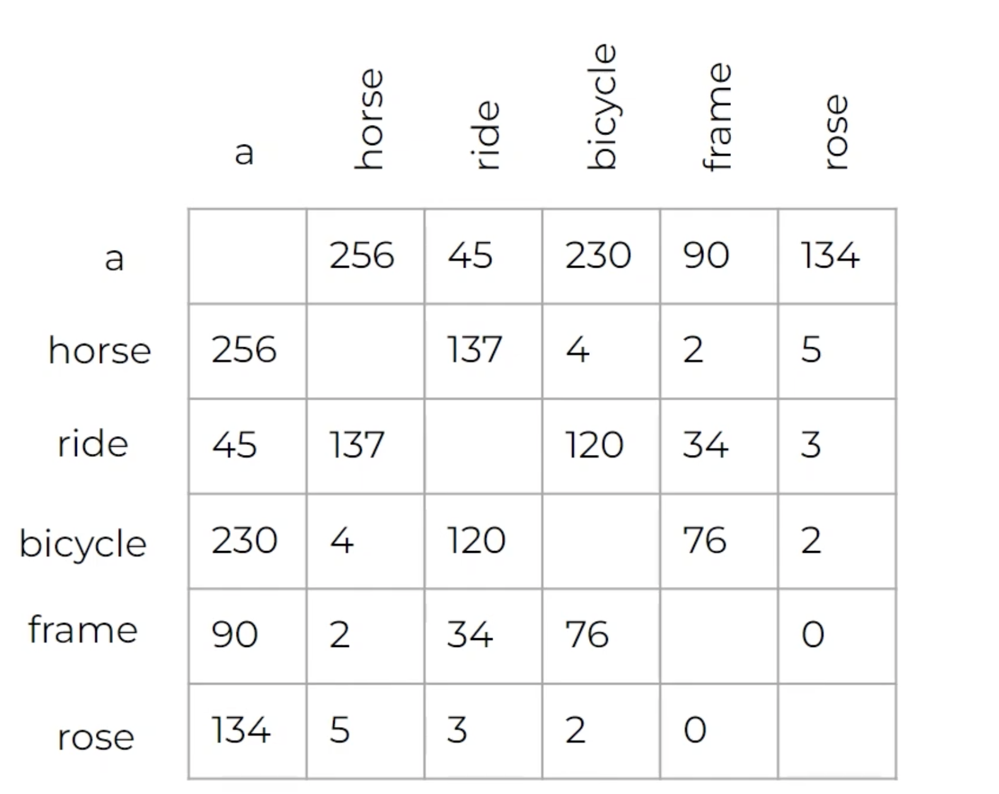

# Advantages and Disadvantages

"""
### Advantages:

- Vectors begin to reflect the meaning of words! They can be compared for similarity by distance (cosine distance/MSE);

### Disadvantages:

- Vectors are still quite sparse, requiring a lot of extra memory;
- Vocabulary size is limited. Words not in the vocabulary cannot be processed;
- When the vocabulary size changes, the vectors need to be recalculated;
- Vectors of rare words are not very informative.
"""


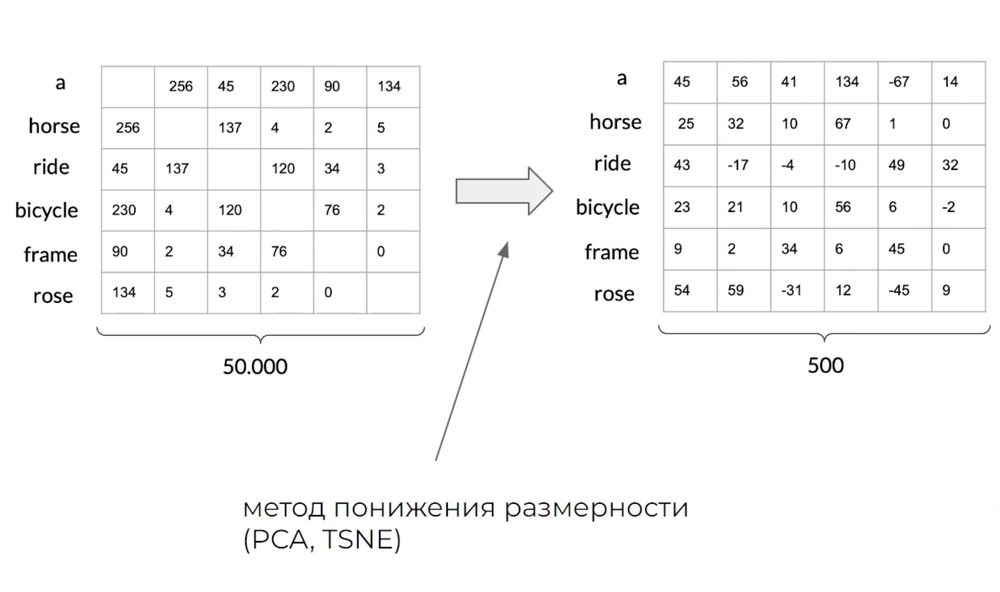


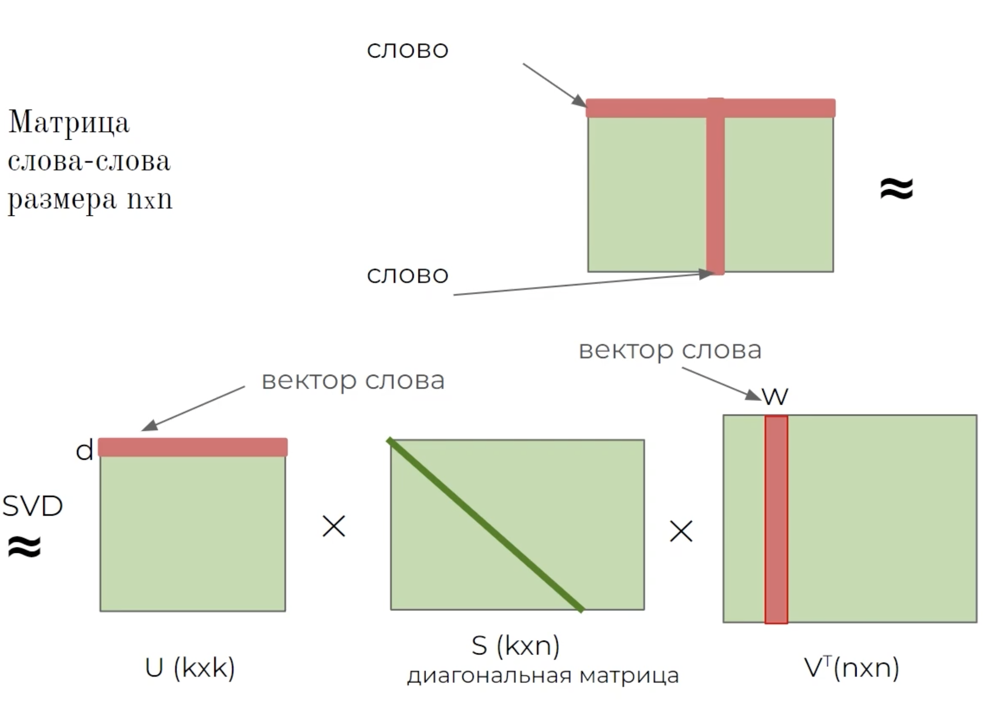

# Word Embeddings

"""
### Word Embeddings

Everything we have done so far was based on some considerations for constructing word/document vectors/matrices that somehow reflected the meaning of words/documents.

But what if we try to **learn** word/document vectors?

### What We Want:

We want to learn word vectors of small dimensionality that reflect the meaning of words: they can be compared with each other using some metric.

These learned vectors will be called **word embeddings**.

We will train a neural network to predict words that can appear in the context (surrounding this word).
"""


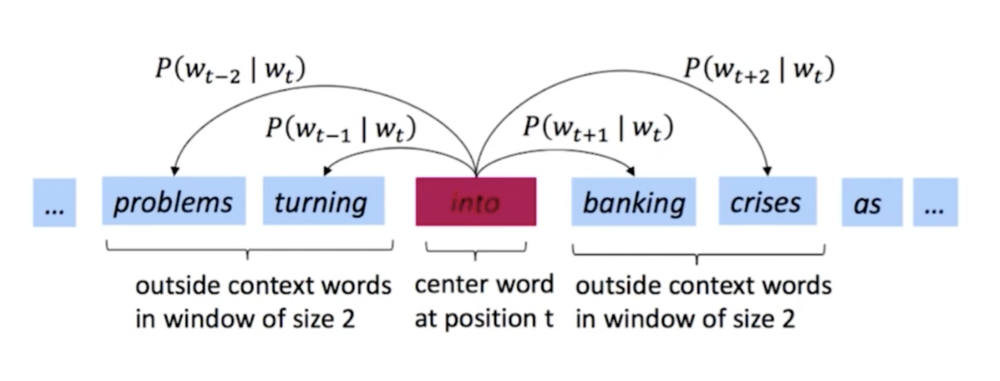

# Word2Vec: Detailed Explanation

"""
### Word2Vec: Detailed Explanation

**Overview:**
Word2Vec is a group of related models that are used to produce word embeddings, which are dense vector representations of words. These models were introduced by Mikolov et al. in 2013 and have since become a fundamental tool in natural language processing (NLP).

### Key Concepts

**1. Word Embeddings:**
- **Definition:** Word embeddings are dense vector representations of words in a continuous vector space where semantically similar words are mapped to nearby points.
- **Purpose:** To capture semantic relationships between words, allowing similar words to have similar representations.

**2. Training Objectives:**
Word2Vec models can be trained using two different approaches: Continuous Bag of Words (CBOW) and Skip-Gram.

### Continuous Bag of Words (CBOW)

**Objective:**
- Predict the target word (center word) using the context words (surrounding words).

**Mathematical Formulation:**

1. **Context Window:**
   - Given a context window size $ c $, the context words for a target word $ w_t $ are $ \{w_{t-c}, \ldots, w_{t-1}, w_{t+1}, \ldots, w_{t+c}\} $.

2. **Input Representation:**
   - Each word in the vocabulary is represented as a one-hot encoded vector. If the vocabulary size is $ V $, the one-hot vector for word $ w $ is a $ V $-dimensional vector with a 1 at the index corresponding to $ w $ and 0s elsewhere.

3. **Hidden Layer:**
   - The input vectors are averaged to form a hidden layer representation:
     $$ h = \frac{1}{2c} \sum_{i=-c, i \neq 0}^{c} x_{t+i} $$
     where $ x_{t+i} $ is the one-hot vector of the $ i $-th context word.

4. **Output Layer:**
   - The hidden layer is mapped to an output layer with a softmax activation function to produce probabilities for all words in the vocabulary:
     $$ P(w_t | w_{t-c}, \ldots, w_{t-1}, w_{t+1}, \ldots, w_{t+c}) = \frac{\exp(u_{w_t})}{\sum_{w \in V} \exp(u_w)} $$
     where $ u_w $ is the score for word $ w $ computed as:
     $$ u_w = h \cdot v_w $$
     and $ v_w $ is the output vector for word $ w $.

5. **Loss Function:**
   - The objective is to maximize the log probability of the correct word:
     $$ \mathcal{L} = - \log P(w_t | w_{t-c}, \ldots, w_{t-1}, w_{t+1}, \ldots, w_{t+c}) $$

### Skip-Gram

**Objective:**
- Predict the context words using the target word.

**Mathematical Formulation:**

1. **Context Window:**
   - Given a context window size $ c $, the context words for a target word $ w_t $ are $ \{w_{t-c}, \ldots, w_{t-1}, w_{t+1}, \ldots, w_{t+c}\} $.

2. **Input Representation:**
   - Each word in the vocabulary is represented as a one-hot encoded vector. If the vocabulary size is $ V $, the one-hot vector for word $ w $ is a $ V $-dimensional vector with a 1 at the index corresponding to $ w $ and 0s elsewhere.

3. **Hidden Layer:**
   - The input vector $ x_t $ (one-hot vector of the target word) is mapped to a hidden layer representation:
     $$ h = x_t \cdot W $$
     where $ W $ is a $ V \times N $ weight matrix (embedding matrix).

4. **Output Layer:**
   - The hidden layer is mapped to an output layer with a softmax activation function to produce probabilities for all words in the vocabulary:
     $$ P(w_{t+j} | w_t) = \frac{\exp(u_{w_{t+j}})}{\sum_{w \in V} \exp(u_w)} $$
     where $ u_{w_{t+j}} $ is the score for word $ w_{t+j} $ computed as:
     $$ u_{w_{t+j}} = h \cdot v_{w_{t+j}} $$
     and $ v_{w_{t+j}} $ is the output vector for word $ w_{t+j} $.

5. **Loss Function:**
   - The objective is to maximize the log probability of the context words:
     $$ \mathcal{L} = - \sum_{j=-c, j \neq 0}^{c} \log P(w_{t+j} | w_t) $$

### Optimization and Training

1. **Stochastic Gradient Descent (SGD):**
   - Both CBOW and Skip-Gram models are trained using Stochastic Gradient Descent (SGD) to minimize the loss function.

2. **Negative Sampling:**
   - To make training more efficient, negative sampling is used. Instead of updating the weights for all words in the vocabulary, only a few negative samples (randomly chosen words) are updated.
   - The loss function for negative sampling is:
     $$ \mathcal{L} = - \log \sigma(u_{w_t}) - \sum_{i=1}^{k} \log \sigma(-u_{w_i'}) $$
     where $ \sigma $ is the sigmoid function, $ u_{w_t} $ is the score of the true word, and $ u_{w_i'} $ are the scores of the negative samples.

3. **Hierarchical Softmax:**
   - An alternative to negative sampling, hierarchical softmax uses a binary tree representation of the output layer to reduce the computational complexity of the softmax function.

### Word2Vec Implementation (Using Gensim)

Here’s an example of training Word2Vec models using the Gensim library:

```python

# Training the Word2Vec model using CBOW
model_cbow = Word2Vec(sentences, vector_size=100, window=2, min_count=1, sg=0)  # sg=0 means CBOW model

# Training the Word2Vec model using Skip-Gram
model_skipgram = Word2Vec(sentences, vector_size=100, window=2, min_count=1, sg=1)  # sg=1 means Skip-Gram model


# Word2Vec

"""
### Formalize the task:

- A classification task is set.
  The number of classes is the vocabulary size $ n $.
- The neural network takes a word as input and outputs $ n $ values — a distribution over the words in the vocabulary.
- The loss function is the cross-entropy between the distribution given by the network and the correct distribution (one-hot vector).
"""
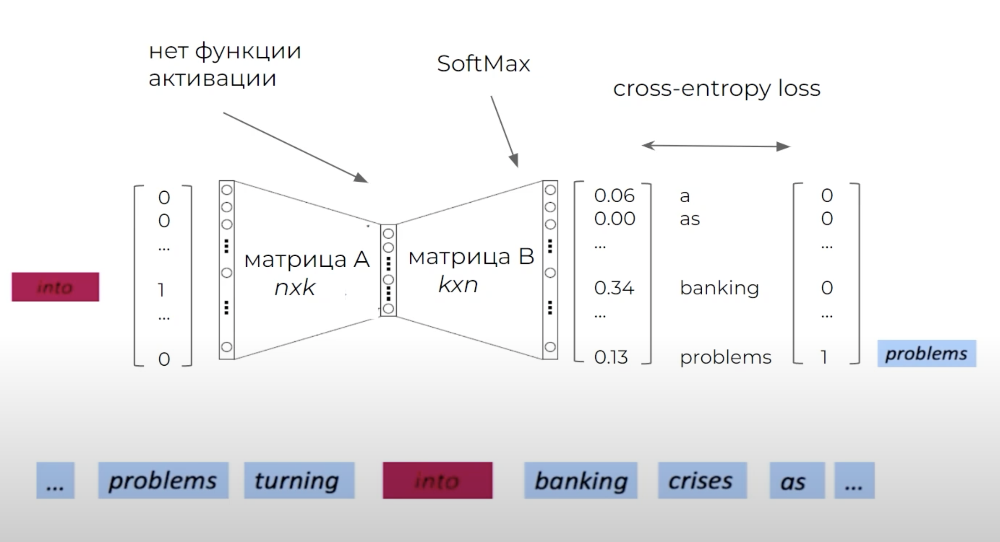
For each iteration we are getting one word in context. 


# Why No Activation Function in Word2Vec?

"""
In Word2Vec, activation functions are not used due to the following reasons:

1. **Simplified Architecture:**
   - Word2Vec uses an embedding layer that maps words to dense vectors, updated directly during training.
   - The output layer is typically a softmax layer that normalizes output into probabilities.

2. **Objective Function:**
   - Softmax and negative sampling are used to compute probability distributions over the vocabulary.
   - The main operation is the dot product between word vectors, capturing similarity without needing non-linear transformations.

3. **Training Efficiency:**
   - The simplicity (using dot products and softmax/negative sampling) allows for efficient training on large datasets.
   - Adding activation functions would increase computational complexity without necessarily improving embeddings.

4. **Representation Learning:**
   - Word2Vec learns linear relationships between words in a vector space effectively through dot products.
   - The resulting embeddings capture semantic relationships and analogies well.

This simplicity and efficiency make Word2Vec widely used and effective in many NLP tasks.
"""


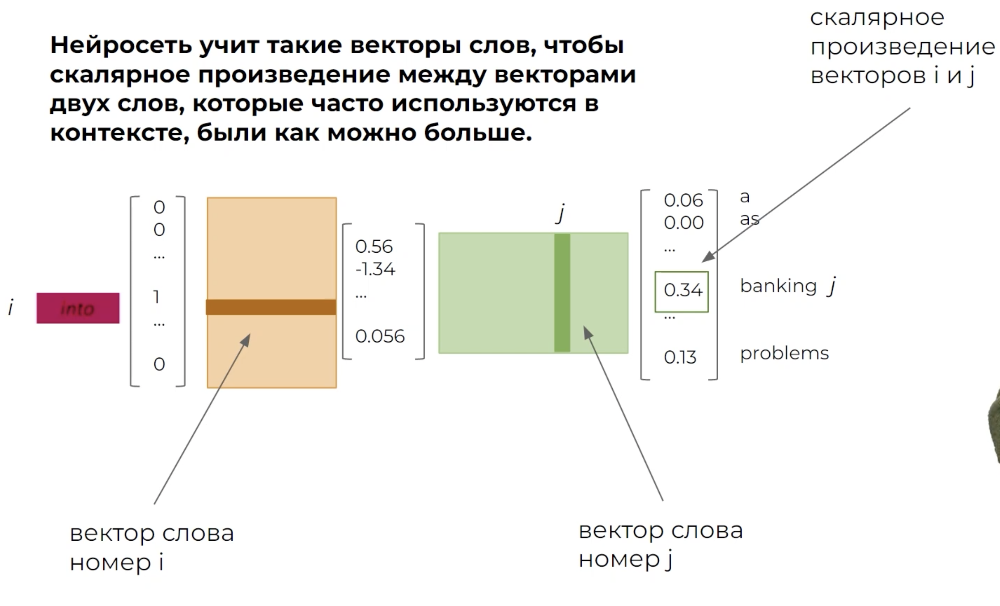

# Word2Vec: Vector Representation

"""
After training the network, we obtain vectors of size $ k $ for all words in the vocabulary.
We can set the size $ k $ ourselves.

These vectors contain the meaning of words. They can be compared with each other using cosine distance.
Cosine distance is the normalized dot product of two vectors.

$$
similarity(A, B) = \frac{A \cdot B}{||A|| \times ||B||} = \frac{\sum_{i=1}^n A_i \times B_i}{\sqrt{\sum_{i=1}^n A_i^2} \times \sqrt{\sum_{i=1}^n B_i^2}}
$$
"""

# Word2Vec: Advantages and Disadvantages

"""
### Advantages:

- Vectors reflect the meaning of words;
- The dimensionality of vectors does not depend on the size of the vocabulary;
- When adding documents, vectors can be further trained.

### Disadvantages:

- Fixed vocabulary size. When the vocabulary size of documents changes, the vectors need to be recalculated;
- For rare words, embeddings are suboptimal;
- Words with the same root are processed differently by the neural network.
  Examples: eat, eater, eating
"""



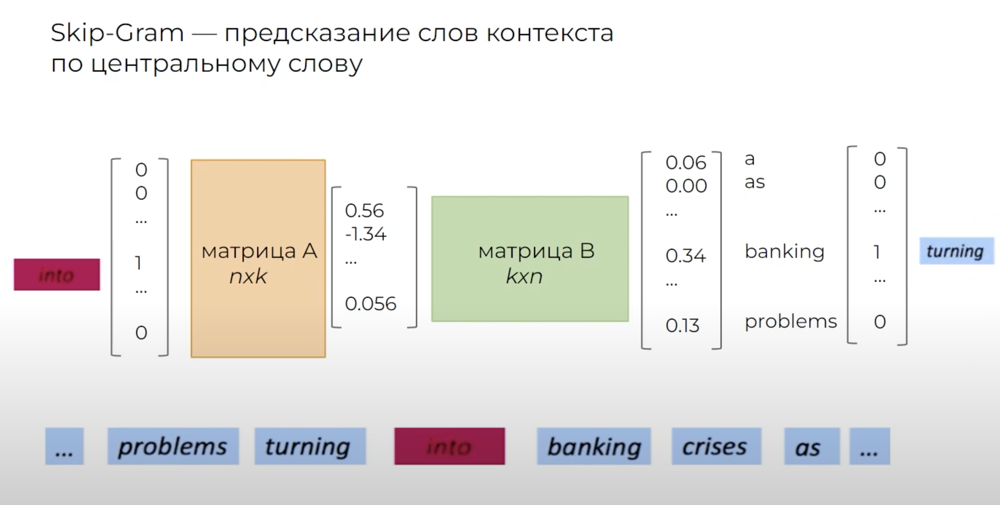
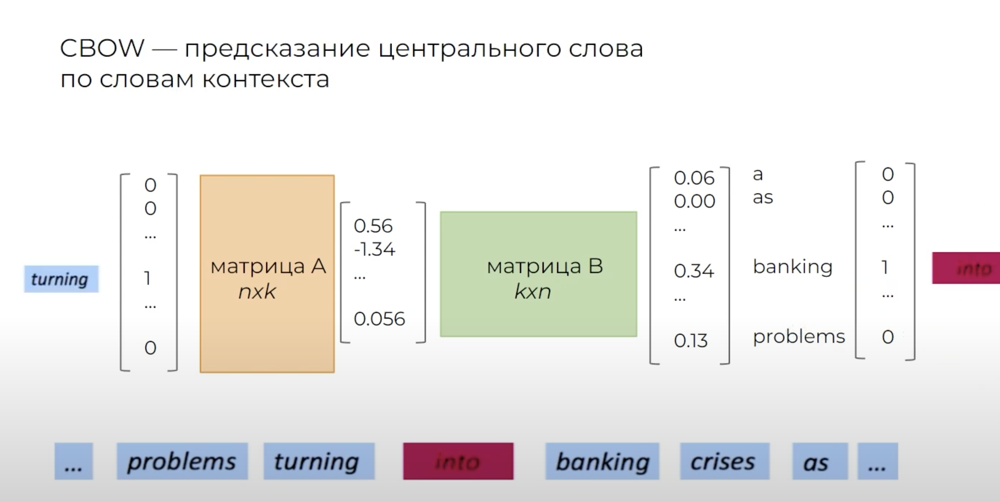
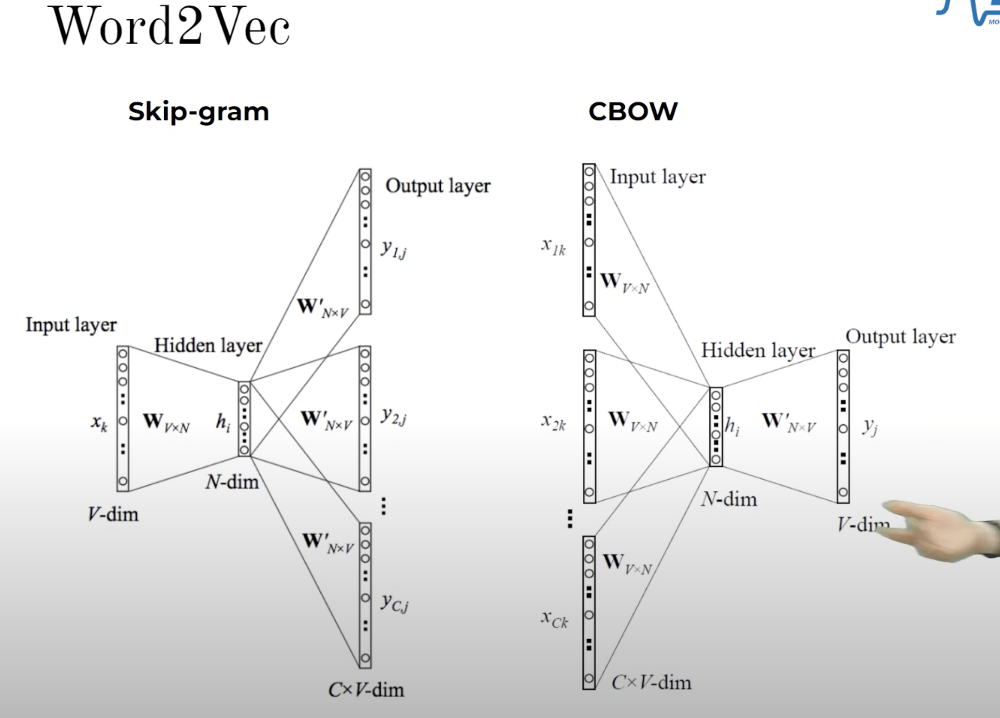


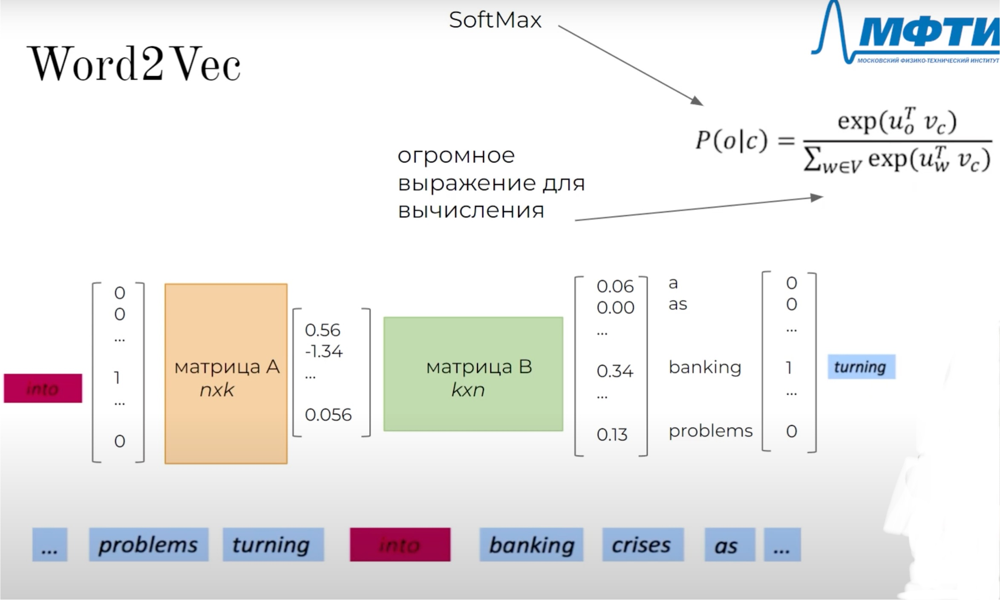

# Content

In this demo, we will train a word2vec model on custom data. We will use IMDB dataset as our training data

a word2vec model is another way to convert strings(or words) to numerical represntation, so those vectors can then be used to perform some task or train another model.

A word2vec uses Continuous bag of words technique to learn embeddings of words it sees during training, and then saves them. After training, we can infer those vectors by providing the word. We will not delve into details about contiuous bag of words (CBOW) here.

The special thing about word2vec vectors (which is not found in TF-IDF or word to index) is that the distance in word2vec vectors (between each other) also represent information about how similar the words are to each other

for example, the vectors of words "cat" and "dog" will have a higher similarity (or lower distance) compared to the vectors of words "cat" and "building"


## Preparing the data

Load the IMDB dataset, specifically the training split, and select only the text column. The dataset is then shortened to the first 500 rows to speed up the training process.

In [10]:
train_data = load_dataset('imdb', split='train')['text']  # Load the IMDB dataset and select the text from the training split
train_data = train_data[:500]  # Shorten the data to the first 500 rows to speed up training

This line tokenizes the training data. It converts each text to lowercase and then tokenizes it into words using nltk's word_tokenize function. The progress of tokenization is displayed using tqdm.

In [11]:
tokenized_train_data = [word_tokenize(text.lower()) for text in tqdm(train_data, desc='Tokenizing data')]

Tokenizing data: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 798.35it/s]


## Train the model

This line trains a Word2Vec model on the tokenized training data. The model is trained with a vector size of 128, a window size of 5, a minimum word count of 1, and 4 worker threads. The progress of training is displayed using tqdm.

#TODO window, min_count, workers

In [12]:

model = Word2Vec(tokenized_train_data, vector_size=128, window=5, min_count=1, workers=4) # Training the Word2Vec model using CBOW

In [13]:
word_vectors = model.wv  # Extract the word vectors from the trained Word2Vec model

## Try the model

These lines define a list of test words and get their corresponding vectors from the trained Word2Vec model.

In [14]:
test_words = ['cat', 'dog', 'building', 'movie', 'action', 'comedy', 'fight', 'plot', 'laugh']
test_word_vectors = [word_vectors[word] for word in test_words]

These lines calculate the cosine similarity between each test word and the remaining test words. The similarities are sorted in descending order, and the results are stored in a dictionary.

In [15]:
test_words_similarity_map = {}  # Initialize an empty dictionary to store the similarity mappings for the test words
# Map each test word to all other words where the other words list is sorted according to similarity (most similar first)
for i, word in enumerate(test_words):
    remaining_words = test_words[:i] + test_words[i+1:]  # Get the remaining test words excluding the current word
    remaining_word_vectors = test_word_vectors[:i] + test_word_vectors[i+1:]  # Get the vectors for the remaining words
    word_to_remaining_cosine_sims = cosine_similarity(test_word_vectors[i].reshape(1, -1), remaining_word_vectors)[0]  # Calculate cosine similarities between the current word and the remaining words
    sorting_order = word_to_remaining_cosine_sims.argsort()[::-1]  # Sort the similarities in descending order
    ordered_remaining_words = [remaining_words[j] for j in sorting_order]  # Order the remaining words according to similarity
    test_words_similarity_map[word] = list(zip(ordered_remaining_words, word_to_remaining_cosine_sims[sorting_order]))  # Map the current word to its ordered similarities

In [16]:
test_words_similarity_map['cat']  # Display the similarity map for the word 'cat'

[('comedy', 0.9821273),
 ('fight', 0.98152864),
 ('action', 0.97688377),
 ('dog', 0.9752332),
 ('building', 0.97501516),
 ('movie', 0.95743173),
 ('plot', 0.95127696),
 ('laugh', 0.94225526)]

In [17]:
test_words_similarity_map['action']  # Display the similarity map for the word 'action'

[('comedy', 0.99628186),
 ('fight', 0.99037033),
 ('plot', 0.9888472),
 ('building', 0.9874831),
 ('movie', 0.9813696),
 ('dog', 0.9803688),
 ('cat', 0.97688377),
 ('laugh', 0.9254451)]

In [18]:
test_words_similarity_map['comedy']  # Display the similarity map for the word 'comedy'

[('fight', 0.99733645),
 ('action', 0.99628186),
 ('building', 0.9918797),
 ('dog', 0.9892731),
 ('cat', 0.9821273),
 ('movie', 0.9814192),
 ('plot', 0.9753896),
 ('laugh', 0.95241964)]

In [19]:
test_words_similarity_map['laugh']  # Display the similarity map for the word 'laugh'

[('fight', 0.9631289),
 ('dog', 0.9616761),
 ('comedy', 0.95241964),
 ('building', 0.9496225),
 ('cat', 0.94225526),
 ('action', 0.9254451),
 ('movie', 0.922649),
 ('plot', 0.86864376)]

## Finidng similar words

Since the vectors now represent a dimension of similarity, word2vec also allows us to find similar words to a word (much like we did above but from the whole corpus instead of a selective words)

word2vec also performs reasonably well for doing things like:

king_vec - man_vec + woman_vec = queen_vec (a famous example). However for good results, do note that the model needs to be trained on siginificant data. Our model is trained on a very small data (relatively) to do things like this

In [20]:
word_vectors.most_similar('movie')  # Find the words most similar to 'movie' using the trained Word2Vec model

[('bad', 0.9968243837356567),
 ('was', 0.9965192079544067),
 ('not', 0.9963883757591248),
 ('this', 0.9951858520507812),
 ('disappointed', 0.9937664270401001),
 ('so', 0.9936737418174744),
 ('only', 0.993537187576294),
 ('thing', 0.9930278658866882),
 ('what', 0.9929496049880981),
 ('recommend', 0.9927570819854736)]

In [21]:
word_vectors.most_similar('mother')  # Find the words most similar to 'mother' using the trained Word2Vec model

[('their', 0.9991644024848938),
 ('who', 0.9990016222000122),
 ('head', 0.9989002346992493),
 ('into', 0.9988999366760254),
 ('an', 0.998886227607727),
 ('gets', 0.9988777041435242),
 ('shows', 0.9988738298416138),
 ('`', 0.9988369345664978),
 ('old', 0.9987870454788208),
 ('turns', 0.9986979961395264)]

### Task 1: Data Exploration and Cleaning
Explore the Dataset:


*  Load the entire IMDB dataset and perform an initial exploration to understand its structure and content.

*  Identify any missing values and handle them appropriately.


*  Check for duplicate entries.

In [22]:
# Load the entire dataset
imdb_data = load_dataset('imdb')

# Explore the dataset
print(imdb_data)

# Check for missing values in the text column
missing_values_train = sum(1 for x in imdb_data['train']['text'] if x is None)
missing_values_test = sum(1 for x in imdb_data['test']['text'] if x is None)
print(f"Missing values in train data: {missing_values_train}")
print(f"Missing values in test data: {missing_values_test}")

# Remove rows with missing values (if any)
imdb_data['train'] = imdb_data['train'].filter(lambda x: x['text'] is not None)
imdb_data['test'] = imdb_data['test'].filter(lambda x: x['text'] is not None)

# Check for duplicates
unique_train_texts = len(set(imdb_data['train']['text']))
unique_test_texts = len(set(imdb_data['test']['text']))
print(f"Unique texts in train data: {unique_train_texts}")
print(f"Unique texts in test data: {unique_test_texts}")

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    unsupervised: Dataset({
        features: ['text', 'label'],
        num_rows: 50000
    })
})
Missing values in train data: 0
Missing values in test data: 0
Unique texts in train data: 24904
Unique texts in test data: 24801


### Task 2: Text Cleaning
* Implement a function to clean the text data by removing HTML tags, punctuation, and special characters.

* Apply this function to the IMDB dataset before tokenization.


The re module in Python is used for working with regular expressions, which are a powerful tool for matching patterns in strings. Regular expressions can be used for a variety of text processing tasks such as searching for patterns, replacing text, and splitting strings.

In [23]:
import re

def clean_text(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    # Remove punctuation and special characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

# Apply text cleaning
cleaned_train_data = [clean_text(text) for text in imdb_data['train']['text']]
cleaned_test_data = [clean_text(text) for text in imdb_data['test']['text']]


### Task 3: Custom Word2Vec Model
* Train Custom Word2Vec Model:
* Train a custom Word2Vec model using the cleaned and tokenized IMDB dataset.
* Experiment with different hyperparameters (e.g., vector size, window size) and document their impact on the model's performance.§m

In [24]:
# Tokenize the data
cleaned_tokenized_train_data = [word_tokenize(text.lower()) for text in tqdm(cleaned_train_data, desc='Cleaning and tokenizing data')]

# Train the Word2Vec model with different hyperparameters
model_custom = Word2Vec(cleaned_tokenized_train_data, vector_size=150, window=10, min_count=2, workers=4)
word_vectors_custom = model_custom.wv

# Document the impact of hyperparameters
# Train multiple Word2Vec models with different hyperparameters
models = {}
hyperparams = [
    {'vector_size': 100, 'window': 5, 'min_count': 1, 'workers': 4},
    {'vector_size': 200, 'window': 5, 'min_count': 1, 'workers': 4},
    {'vector_size': 100, 'window': 10, 'min_count': 1, 'workers': 4},
    {'vector_size': 100, 'window': 5, 'min_count': 5, 'workers': 4},
]

for params in hyperparams:
    model_name = f"size_{params['vector_size']}_window_{params['window']}_mincount_{params['min_count']}"
    models[model_name] = Word2Vec(cleaned_tokenized_train_data, **params)

# Function to compare most similar words
def compare_similar_words(models, word, topn=5):
    print(f"Comparing similar words for: {word}")
    for model_name, model in models.items():
        try:
            similar_words = model.wv.most_similar(word, topn=topn)
            print(f"\nModel: {model_name}")
            for similar_word, similarity in similar_words:
                print(f"  {similar_word}: {similarity:.4f}")
        except KeyError:
            print(f"\nModel: {model_name} does not contain the word: {word}")

# Compare the most similar words for selected words
words_to_compare = ['movie', 'happy', 'action']

for word in words_to_compare:
    compare_similar_words(models, word)


Cleaning and tokenizing data: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25000/25000 [00:15<00:00, 1639.48it/s]


Comparing similar words for: movie

Model: size_100_window_5_mincount_1
  film: 0.9330
  flick: 0.7318
  sequel: 0.6947
  picture: 0.6775
  documentary: 0.6719

Model: size_200_window_5_mincount_1
  film: 0.8960
  flick: 0.7293
  documentary: 0.6568
  sequel: 0.6449
  show: 0.6432

Model: size_100_window_10_mincount_1
  film: 0.8729
  flick: 0.6616
  it: 0.6009
  mess: 0.5981
  sequel: 0.5869

Model: size_100_window_5_mincount_5
  film: 0.9349
  flick: 0.7370
  sequel: 0.6627
  it: 0.6530
  show: 0.6373
Comparing similar words for: happy

Model: size_100_window_5_mincount_1
  afraid: 0.6245
  confused: 0.6024
  bored: 0.5833
  satisfied: 0.5773
  sick: 0.5743

Model: size_200_window_5_mincount_1
  afraid: 0.5998
  disappointed: 0.5836
  pleased: 0.5682
  confused: 0.5660
  sick: 0.5564

Model: size_100_window_10_mincount_1
  afraid: 0.5517
  bored: 0.5334
  sad: 0.5275
  sick: 0.5120
  sorry: 0.5105

Model: size_100_window_5_mincount_5
  afraid: 0.5862
  confused: 0.5629
  disappointed

### Documentation

* The impact of changing vector_size on the model's ability to capture word similarities.
How increasing the window size affects the context and relationships learned by the model.
The effect of the min_count parameter on vocabulary coverage and the inclusion of less frequent words.
Any interesting patterns or anomalies observed in the results.

* Increasing the vector_size from 100 to 200 generally results in more detailed and nuanced word embeddings. A larger vector size allows the model to capture more complex relationships between words. However, it also requires more computational resources and may lead to overfitting if the dataset is not large enough.
* The window size determines the context range the model considers when learning word embeddings. A larger window size captures broader context but might include less relevant words, while a smaller window size focuses on closer context.
* The min_count parameter specifies the minimum frequency a word must have to be included in the model's vocabulary. A lower min_count includes more rare words, while a higher min_count filters out less frequent words.

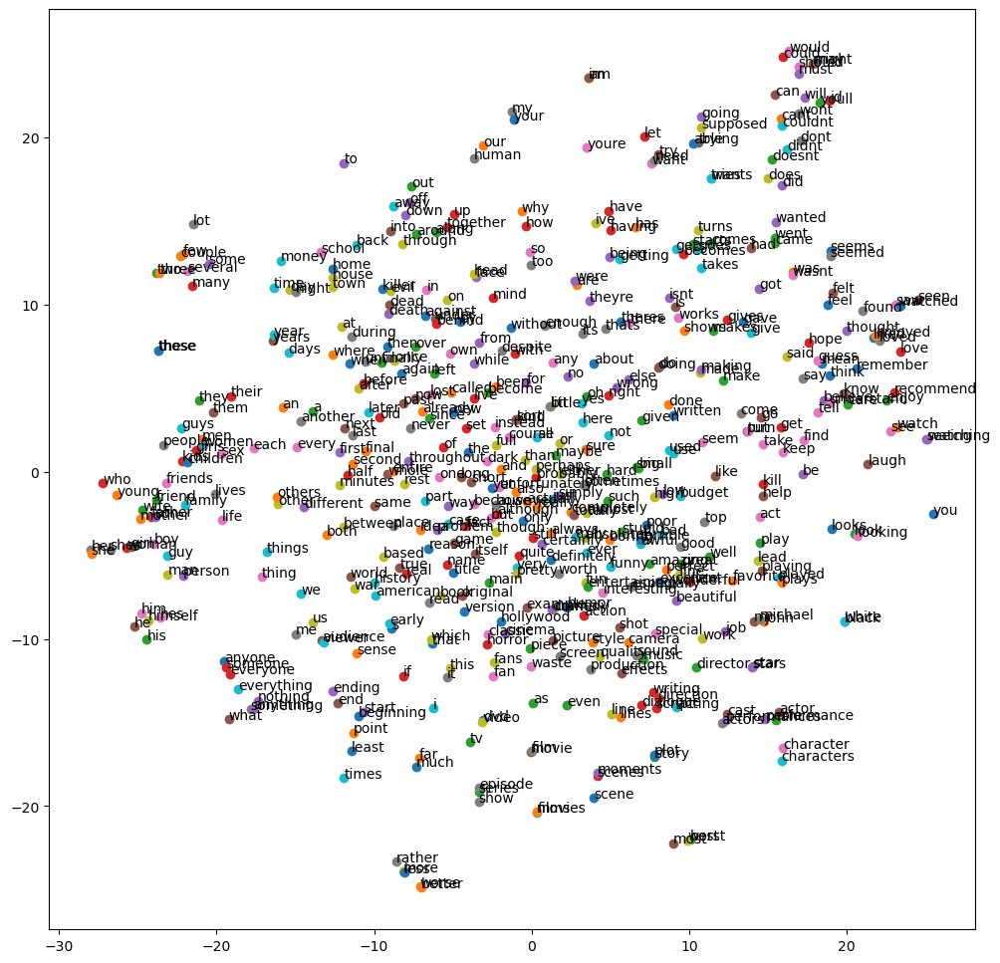

In [25]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Select a subset of words
words = list(word_vectors_custom.index_to_key)[:500]
word_vectors_subset = np.array([word_vectors_custom[word] for word in words])

# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=42)
word_vectors_2d = tsne.fit_transform(word_vectors_subset)

# Plot the embeddings
plt.figure(figsize=(12, 12))
for i, word in enumerate(words):
    plt.scatter(word_vectors_2d[i, 0], word_vectors_2d[i, 1])
    plt.annotate(word, (word_vectors_2d[i, 0], word_vectors_2d[i, 1]))
plt.show()

### Task 5: Semantic Analysis
#### Synonym and Antonym Detection:
* Use the Word2Vec model to find synonyms and antonyms for a given list of words.
* Compare the results with a standard thesaurus and analyze the accuracy.

In [26]:
from nltk.corpus import wordnet
# Ensure you have the wordnet data
nltk.download('omw-1.4')
nltk.download('wordnet')


def find_synonyms_antonyms(word, word_vectors, top_n=10):
    synonyms = word_vectors.most_similar(word, topn=top_n)
    antonyms = word_vectors.most_similar(negative=[word], topn=top_n)
    return synonyms, antonyms

# Test the function
synonyms, antonyms = find_synonyms_antonyms('happy', word_vectors_custom)
print("Synonyms:", synonyms)
print("Antonyms:", antonyms)



# Function to get synonyms and antonyms from WordNet
def get_synonyms_antonyms_thesaurus(word):
    synonyms = set() # Why sets?
    antonyms = set()
    for syn in wordnet.synsets(word): # retrieves all synsets (sets of cognitive synonyms) for the given word from the WordNet database.
        for lemma in syn.lemmas(): # lemmas (the different forms of a word)
            synonyms.add(lemma.name()) # Each lemma's name is added to the synonyms set
            if lemma.antonyms(): # If a lemma has antonyms, the name of the first antonym is added to the antonyms set.
                antonyms.add(lemma.antonyms()[0].name())
    return synonyms, antonyms

# Test the function
synonyms_th, antonyms_th = get_synonyms_antonyms_thesaurus('happy')
print("Synonyms_th:", synonyms_th)
print("Antonyms_th:", antonyms_th)


# Compare Word2Vec results with thesaurus
def compare_with_thesaurus(word, word_vectors, top_n=10):
    w2v_synonyms, w2v_antonyms = find_synonyms_antonyms(word, word_vectors, top_n)
    thesaurus_synonyms, thesaurus_antonyms = get_synonyms_antonyms_thesaurus(word)
    
    w2v_synonyms_set = set([syn[0] for syn in w2v_synonyms])
    w2v_antonyms_set = set([ant[0] for ant in w2v_antonyms])
    
    common_synonyms = w2v_synonyms_set.intersection(thesaurus_synonyms)
    common_antonyms = w2v_antonyms_set.intersection(thesaurus_antonyms)
    
    return {
        'w2v_synonyms': w2v_synonyms_set,
        'w2v_antonyms': w2v_antonyms_set,
        'thesaurus_synonyms': thesaurus_synonyms,
        'thesaurus_antonyms': thesaurus_antonyms,
        'common_synonyms': common_synonyms,
        'common_antonyms': common_antonyms
    }

# Example comparison for a few words
words_to_compare = ['happy', 'sad', 'good', 'bad']

for word in words_to_compare:
    print(f"Comparing thesaurus and Word2Vec synonyms and antonyms for: {word}")
    comparison_results = compare_with_thesaurus(word, word_vectors_custom)
    
    print(f"\nWord: {word}")
    print(f"Word2Vec Synonyms: {comparison_results['w2v_synonyms']}")
    print(f"Thesaurus Synonyms: {comparison_results['thesaurus_synonyms']}")
    print(f"Common Synonyms: {comparison_results['common_synonyms']}")
    
    print(f"Word2Vec Antonyms: {comparison_results['w2v_antonyms']}")
    print(f"Thesaurus Antonyms: {comparison_results['thesaurus_antonyms']}")
    print(f"Common Antonyms: {comparison_results['common_antonyms']}")
    print("\n" + "-"*50 + "\n")

[nltk_data] Downloading package omw-1.4 to /Users/khusrav/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/khusrav/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Synonyms: [('afraid', 0.5984424948692322), ('bored', 0.5168471336364746), ('sad', 0.5166057348251343), ('disappointed', 0.4923991560935974), ('ready', 0.48227277398109436), ('sorry', 0.48200246691703796), ('bitter', 0.48040488362312317), ('sick', 0.4798784852027893), ('asleep', 0.4783506393432617), ('sweet', 0.4765551686286926)]
Antonyms: [('fondo', 0.38847383856773376), ('artists', 0.3724059760570526), ('techniques', 0.3704735040664673), ('mastering', 0.3652641475200653), ('starship', 0.36058494448661804), ('scripts', 0.36051833629608154), ('commonly', 0.35472601652145386), ('multimedia', 0.35397884249687195), ('minigenre', 0.35360920429229736), ('musicbased', 0.35350683331489563)]
Synonyms_th: {'glad', 'happy', 'felicitous', 'well-chosen'}
Antonyms_th: {'unhappy'}
Comparing thesaurus and Word2Vec synonyms and antonyms for: happy

Word: happy
Word2Vec Synonyms: {'bored', 'ready', 'disappointed', 'afraid', 'sorry', 'sick', 'sweet', 'asleep', 'bitter', 'sad'}
Thesaurus Synonyms: {'glad'